#Training leaf diseases with YOLOv5


# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and install requirements
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow


In [ ]:

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

import sys
print("Python version")
print (sys.version)
print("Version info.")
print (sys.version_info)

# Step 2: Assemble Our Dataset

In this notebook, I recommand using Roboflow to create our dataset. 
Firstly, upload your image into Roboflow. 
Secondly, annotate your image into corresponding labels. 

Details:

(https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [11]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [12]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [21]:
dataset.location

'C:\\content\\datasets\\tomatoLeaf-3'

In [13]:
#after following the link above, recieve python code with these fields filled in
from roboflow import Roboflow
rf = Roboflow(api_key="55FZyyhdeOYRcg8sqC0a")
project = rf.workspace("huahua_eric_1999-vip-sina-com").project("tomatoleaf")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/tomatoLeaf-3 in yolov5pytorch:: 100%|█| 1010/1010 [00:00<00:00, 284


In [18]:
!python yolov5/train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache

^C


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference & Testing

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/tomatoLeaf-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-176-gaa7a0e9 torch 1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 444 layers, 86220517 parameters, 0 gradients, 204.1 GFLOPs
image 1/51 /content/datasets/tomatoLeaf-3/test/images/00a7c269-3476-4d25-b744-44d6353cd921___GCREC_Bact-Sp-5807_JPG.rf.6f968c6f6868e9a8948c0d8f8385eb4f.jpg: 416x416 Done. (0.021s)
image 2/51 /content/datasets/tomatoLeaf-3/test/images/00ce4c63-9913-4b16-898c-29f99acf0dc3___RS_Late-B-4982_JPG.rf.2def544eefe1265c550c14e10c603319.jpg: 416x4

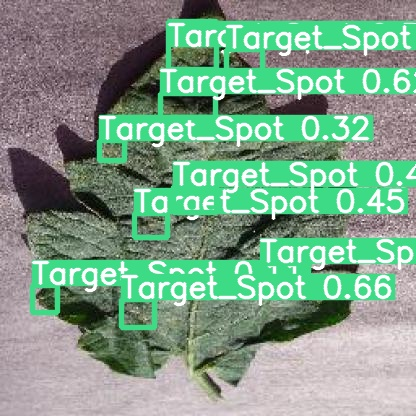

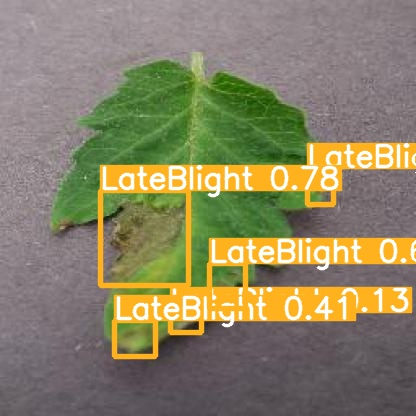

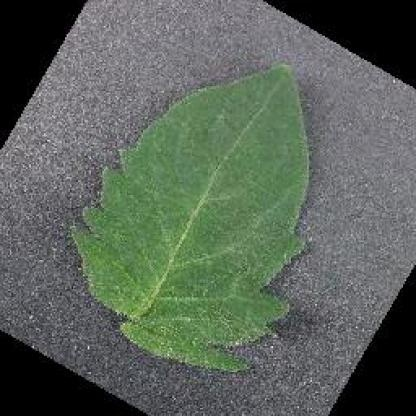

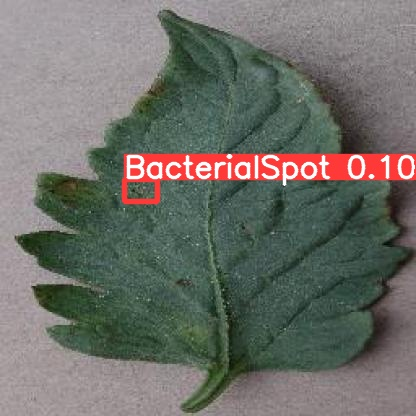

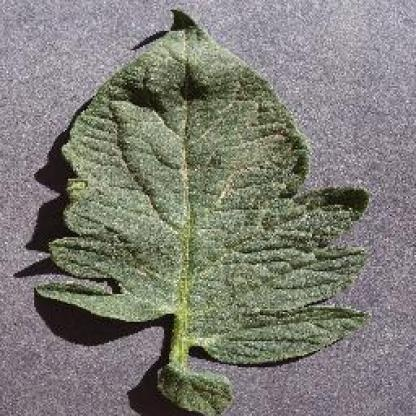

...

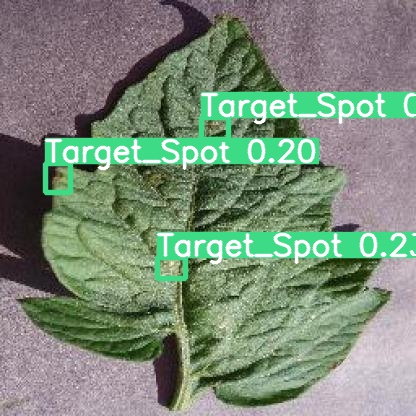

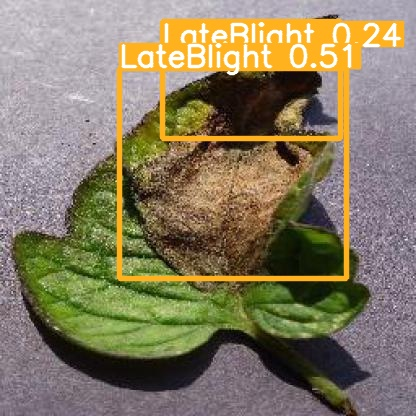

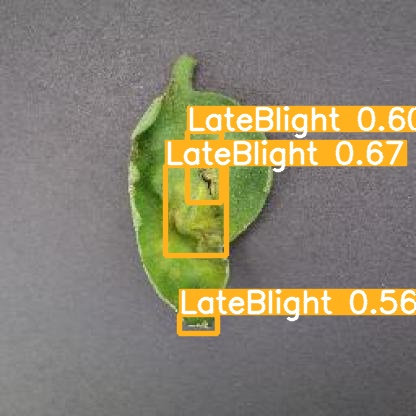

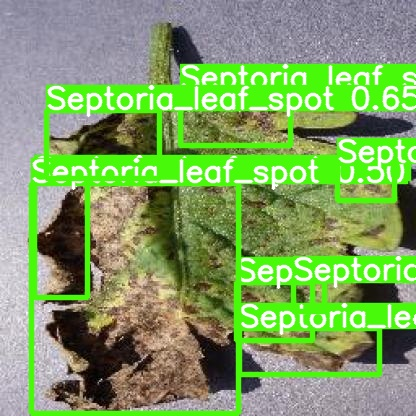

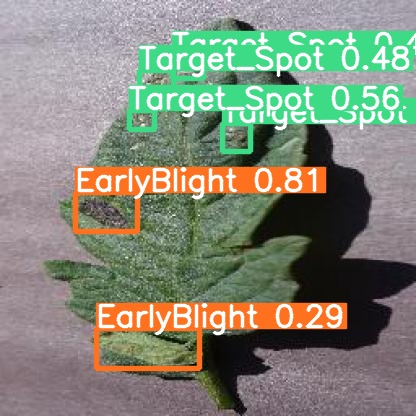

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>